In [1]:
import os
import cv2
from SegTracker import SegTracker
from model_args import aot_args,sam_args,segtracker_args
from PIL import Image
from aot_tracker import _palette
import numpy as np
import torch
import imageio
import matplotlib.pyplot as plt
from scipy.ndimage import binary_dilation, binary_fill_holes
import gc

def save_prediction(pred_mask,output_dir,file_name):
    save_mask = Image.fromarray(pred_mask.astype(np.uint8))
    save_mask = save_mask.convert(mode='P')
    save_mask.putpalette(_palette)
    



C:\Users\awais\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
def save_prediction(pred_mask,output_dir,file_name):
    save_mask = Image.fromarray(pred_mask.astype(np.uint8))
    save_mask = save_mask.convert(mode='P')
    save_mask.putpalette(_palette)
    save_mask.save(os.path.join(output_dir,file_name))

In [3]:
def colorize_mask(pred_mask):
    save_mask = Image.fromarray(pred_mask.astype(np.uint8))
    save_mask = save_mask.convert(mode='P')
    save_mask.putpalette(_palette)
    save_mask = save_mask.convert(mode='RGB')
    return np.array(save_mask)

In [4]:
def draw_mask(img, mask, alpha=0.5, id_countour=False):
    img_mask = np.zeros_like(img)
    img_mask = img
    if id_countour:
        # very slow ~ 1s per image
        obj_ids = np.unique(mask)
        obj_ids = obj_ids[obj_ids!=0]

        for id in obj_ids:
            # Overlay color on  binary mask
            if id <= 255:
                color = _palette[id*3:id*3+3]
            else:
                color = [0,0,0]
            foreground = img * (1-alpha) + np.ones_like(img) * alpha * np.array(color)
            binary_mask = (mask == id)

            # Compose image
            img_mask[binary_mask] = foreground[binary_mask]

            countours = binary_dilation(binary_mask,iterations=1) ^ binary_mask
            img_mask[countours, :] = 0
    else:
        binary_mask = (mask!=0)
        countours = binary_dilation(binary_mask,iterations=1) ^ binary_mask
        foreground = img*(1-alpha)+colorize_mask(mask)*alpha
        img_mask[binary_mask] = foreground[binary_mask]
        img_mask[countours,:] = 0
        
    return img_mask.astype(img.dtype)

In [5]:
def separate_objects(img, mask, alpha=0.5, id_contour=False):
#     mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
    binary_mask = (mask!=0)
    contours = binary_dilation(binary_mask,iterations=1) ^ binary_mask
    filled_contours = binary_fill_holes(contours)
    
    _, labels = cv2.connectedComponents(filled_contours.astype(np.uint8))
#     contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    segmented_objects, regions = [], []
    for label in range(1, np.max(labels)+1):
        
        mask = (labels == label).astype(np.uint8) * 255
        segmented_object = cv2.bitwise_and(img, img, mask=mask)
        
        
        x, y, w, h = cv2.boundingRect(mask)
        
        segmented_object = segmented_object[y:y+h, x:x+w]
        region = img[y:y+h, x:x+w]
        regions.append(region)
        
        white_bg = np.ones_like(segmented_object) * 255
        
        segmented_object_on_white = cv2.bitwise_or(white_bg, segmented_object)
        
        segmented_objects.append(segmented_object_on_white)

    return segmented_objects,regions

In [6]:
def segment_and_save_objects(original_img, segmented_img, save_folder):
    # Create save folder if it doesn't exist
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)


    # Define fixed BGR color values
    colors = {
        # "white": [(254, 254, 254),(255, 255, 255)],
        "blue": [(0, 0, 0),(255, 255, 255)],  # BGR values for blue
        "red": [(0, 0, 254),(0, 0, 255)],  # BGR values for red
        "green": [(0, 254, 0),(0, 255, 0)],
        "black": [(-1, -1, 0),(0, 0, 0)]
    }

    # Segment objects based on fixed colors
    for color, bgr_value in colors.items():
        # Create a mask for the specific color
#         mask = cv2.inRange(segmented_img, bgr_value[0], bgr_value[1])
        contours, _ = cv2.findContours(segmented_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Save segmented objects
        for i, contour in enumerate(contours):
            # Create a mask for each object
            mask = np.zeros_like(segmented_img)
            
            cv2.drawContours(mask, [contour], -1, (255,255,255), -1)

            # Apply the mask to the original image
            masked_img = cv2.bitwise_and(original_img, mask)

            # Save the masked object
            cv2.imwrite(os.path.join(save_folder, f"{color}_object_{i}.png"), masked_img)

### Set parameters for input and output

In [7]:
video_name = 'cell'
io_args = {
    'input_video': f'./assets/{video_name}.mp4',
    'output_mask_dir': f'./assets/{video_name}_masks', # save pred masks
    'output_video': f'./assets/{video_name}_seg.mp4', # mask+frame vizualization, mp4 or avi, else the same as input video
    'output_gif': f'./assets/{video_name}_seg.gif', # mask visualization
}

### Tuning SAM on the First Frame for Good Initialization

No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.


final text_encoder_type: bert-base-uncased
Model loaded from ./ckpt/groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
SegTracker has been initialized


SupervisionWarnings: BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)
(675, 2005)


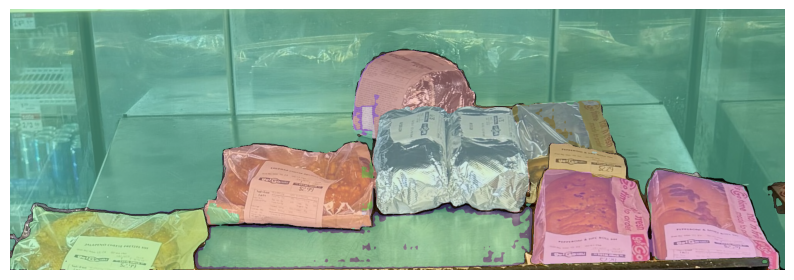

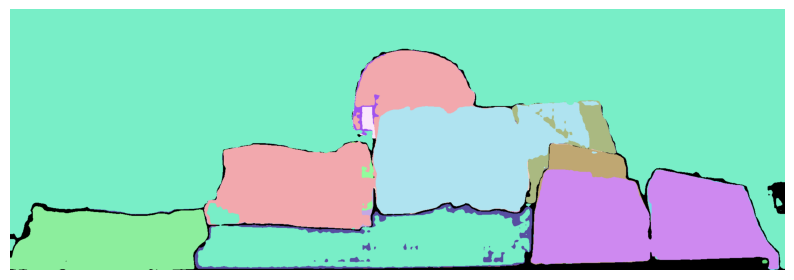

In [9]:
# choose good parameters in sam_args based on the first frame segmentation result
# other arguments can be modified in model_args.py
# note the object number limit is 255 by default, which requires < 10GB GPU memory with amp
sam_args['generator_args'] = {
        'points_per_side': 30,
        'pred_iou_thresh': 0.20,
        'stability_score_thresh': 0.20,
        'crop_n_layers':  1,
        'crop_n_points_downscale_factor': 4,
        'min_mask_region_area': 200,
    }

input_image = "./assets/cropped_image.jpg"
image = cv2.imread(input_image)
# cap = cv2.VideoCapture(io_args['input_video'])
# frame_idx = 0
segtracker = SegTracker(segtracker_args,sam_args,aot_args)
segtracker.restart_tracker()
with torch.cuda.amp.autocast():
    
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    pred_mask, _ = segtracker.detect_and_seg(origin_frame = image, grounding_caption="get items",box_threshold=0.10, text_threshold=0.25)
    torch.cuda.empty_cache()
    obj_ids = np.unique(pred_mask)
    obj_ids = obj_ids[obj_ids!=0]

    init_res = draw_mask(image,pred_mask,id_countour=False)
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(init_res)
    plt.show()
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(colorize_mask(pred_mask))
    plt.show()

    del segtracker
    torch.cuda.empty_cache()
    gc.collect()

In [10]:
def segment_segments(original_img, scaling_image):
    # Initialize an empty list to store segmented images
    segmented_images = []
    original_image = original_img.copy()

    # Iterate over each grayscale level from 0 to the maximum value
    max_value = np.max(scaling_image)
    for level in range(max_value, 0, -1):
        # Threshold the image at the current grayscale level
        _, segmented_img = cv2.threshold(scaling_image, level, 255, cv2.THRESH_BINARY)
        overlay = cv2.bitwise_and(original_image, original_image, mask=segmented_img)
#         x, y, w, h = cv2.boundingRect(segmented_img)
#         print(x,y,w,h)
#         segmented_object = overlay[y:y+h, x:x+w]
        
#         white_bg = np.ones_like(segmented_object, dtype=np.uint8) * 255
#         white_bg = white_bg.astype(np.uint8)
#         segmented_object_on_white = cv2.bitwise_or(white_bg, segmented_object)
        
        # Add the segmented image to the list
        segmented_images.append(overlay)
        original_image = original_image - overlay

    return segmented_images

In [11]:
def update_segmented_images(segmented_images):
    cropped_segmented_images = []
    for seg_image in segmented_images:
        image_contour = cv2.cvtColor(seg_image, cv2.COLOR_RGB2GRAY)
        # Find contours
        contours, _ = cv2.findContours(image_contour, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        padding = 5

        # If contours are found
        if contours:
            # Find the largest contour
            largest_contour = max(contours, key=cv2.contourArea)

            # Get the bounding rectangle
            x, y, w, h = cv2.boundingRect(largest_contour)

            # Calculate the coordinates of the bounding rectangle
            x1, y1 = x - padding, y - padding
            x2, y2 = x + w + padding, y + h + padding

            # Draw the bounding rectangle on the original image
            cropped_image = seg_image[y1:y2,x1:x2]
            cropped_segmented_images.append(cropped_image)
    return cropped_segmented_images

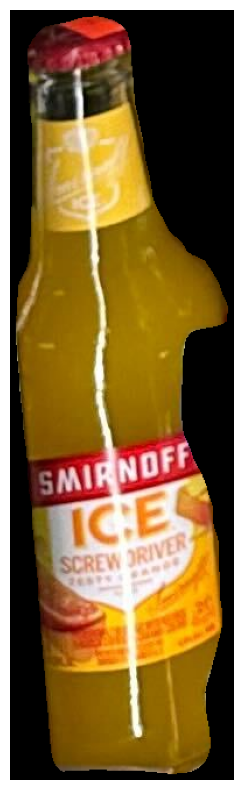

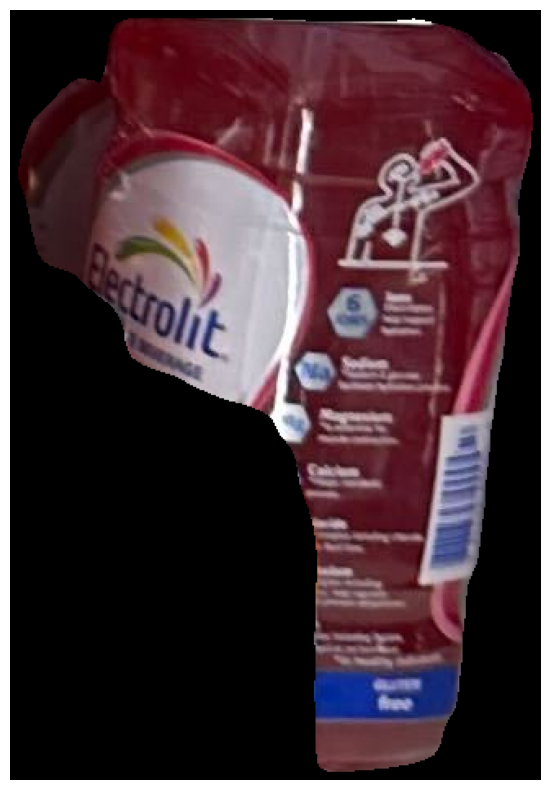

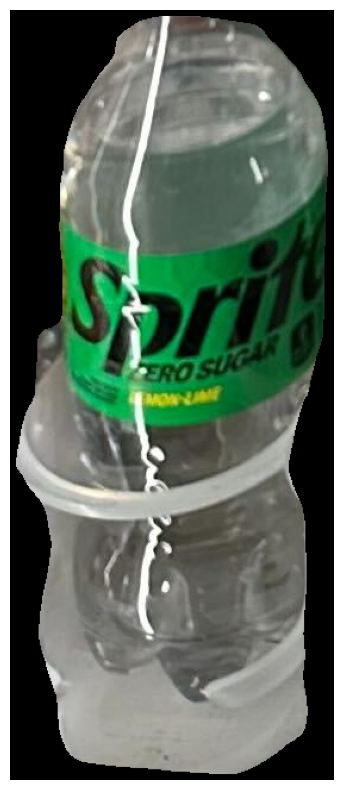

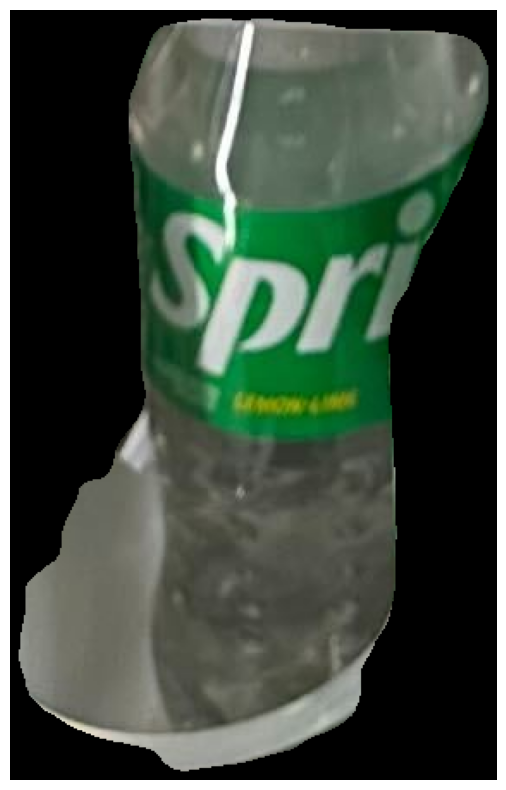

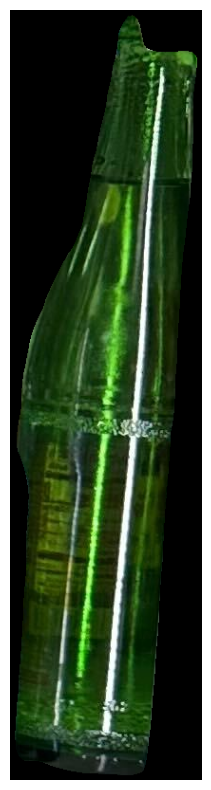

...

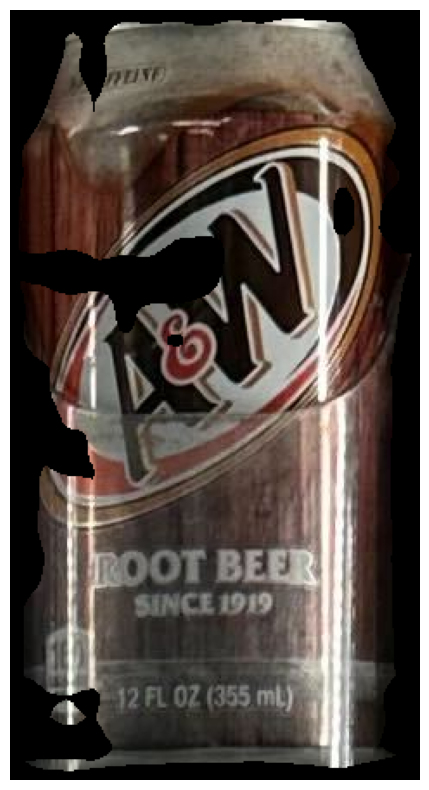

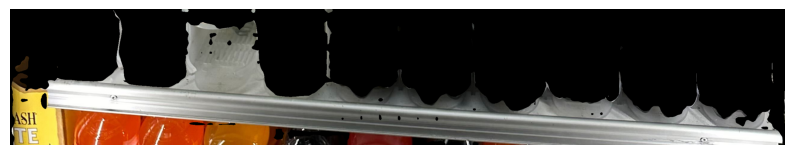

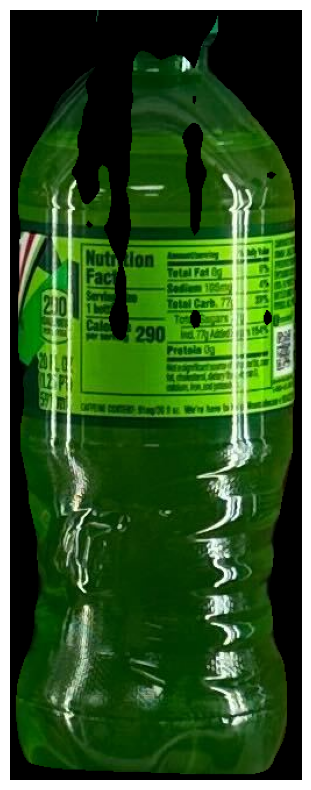

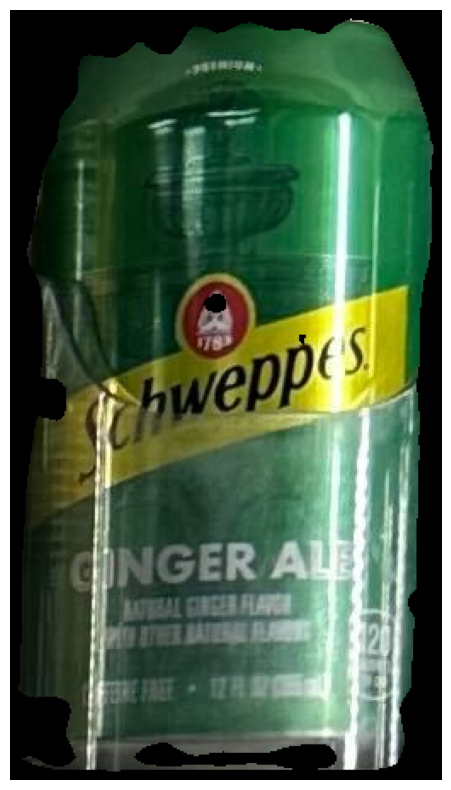

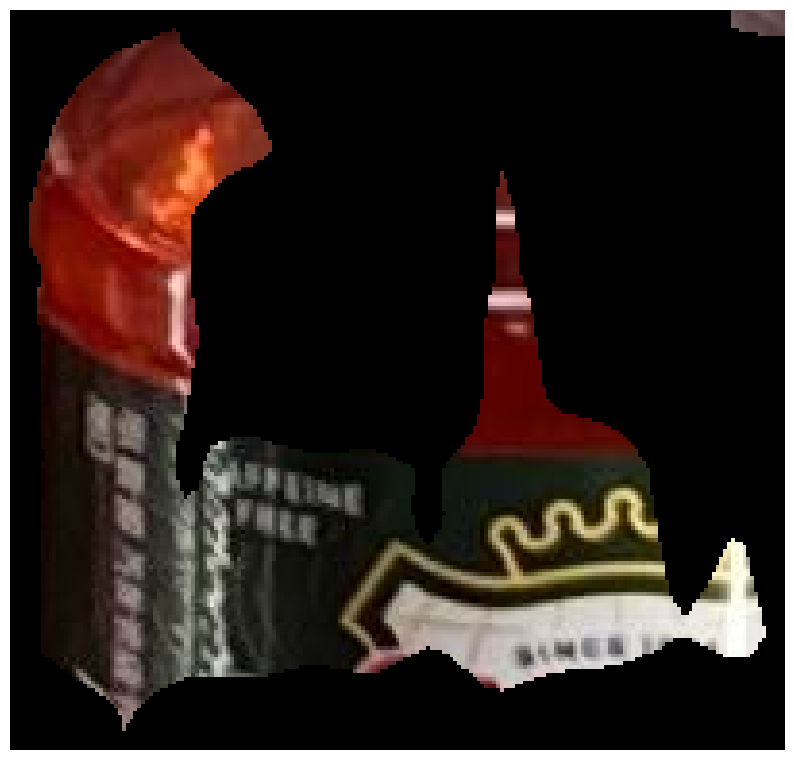

In [13]:
# print(np.unique(pred_mask, dim=3))
# plt.figure(figsize=(10,10))
# plt.axis('off')
# plt.imshow(new_image)
# plt.show()
# new_image = pred_mask*255
# new_image = new_image.astype(np.uint8)
# reg, regions = separate_objects(image, new_image)
input_image = "./assets/IMG_0454.jpg"
org_image = cv2.imread(input_image)
regions = segment_segments(org_image, pred_mask)
cropped_image = update_segmented_images(regions)
for i, obj in enumerate(cropped_image):
    if 0 in obj.shape:
        continue
    plt.figure(figsize=(10,10))
    plt.axis('off')
    obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)
    plt.imshow(obj)
    plt.savefig(f'output_image_{i}.png', bbox_inches='tight', pad_inches=0) 
    plt.show()

In [81]:
print(np.unique(pred_mask))

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37]


### Generate Results for the Whole Video

No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
No module named 'spatial_correlation_sampler'
Failed to import PyTorch Correlation, For better efficiency, please install it.
final text_encoder_type: bert-base-uncased
Model loaded from ./ckpt/groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
SegTracker has been initialized


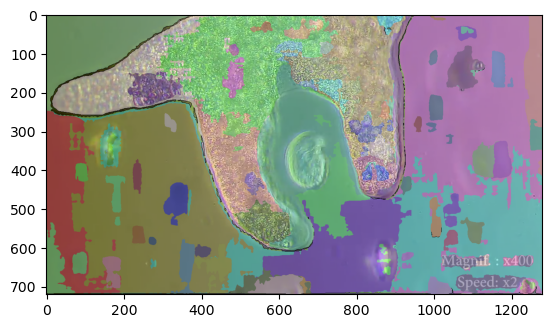

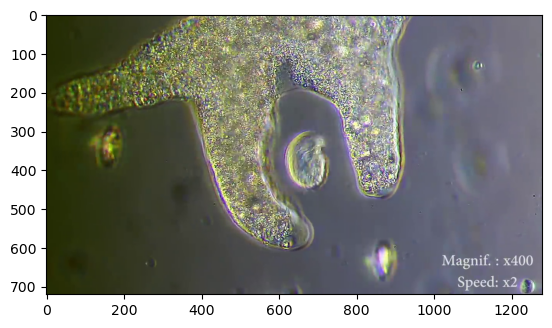

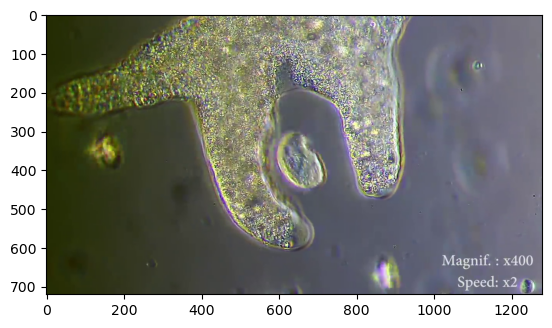

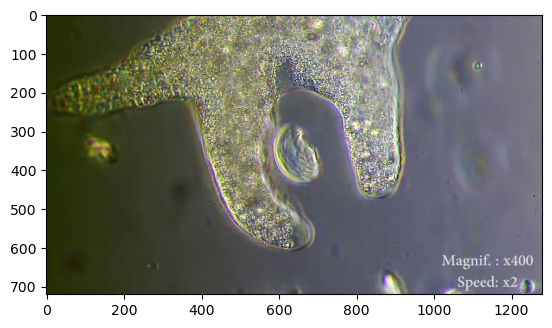

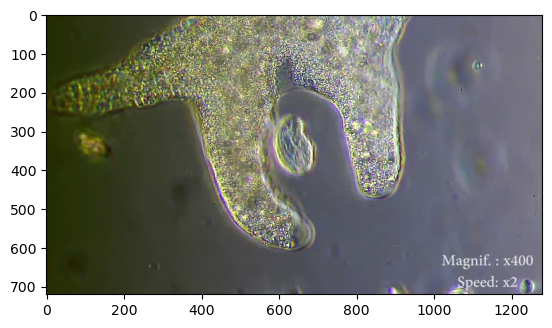

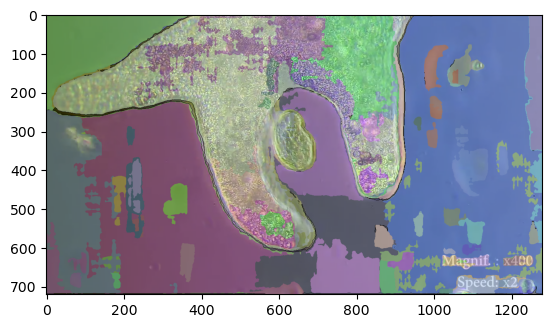

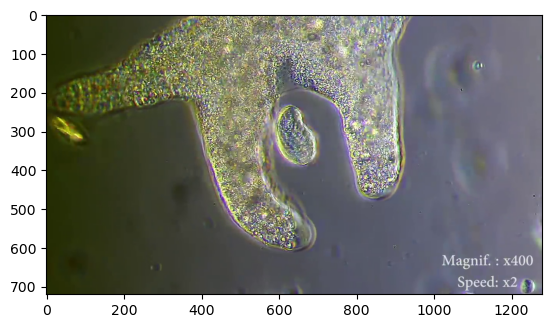

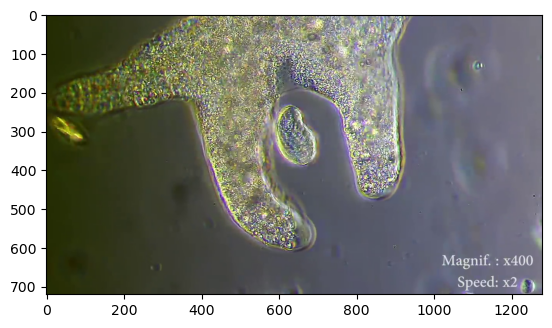

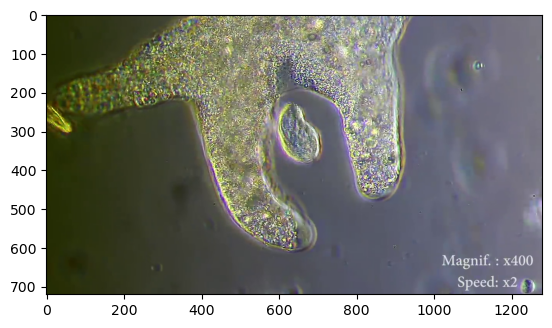

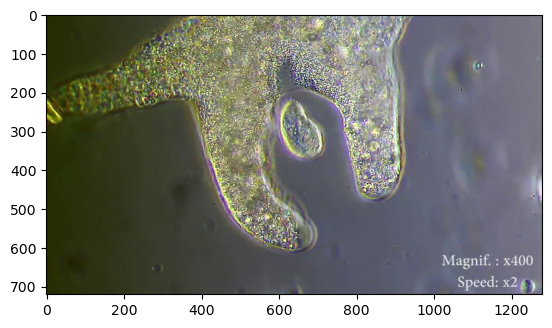

KeyboardInterrupt: 

In [9]:
# For every sam_gap frames, we use SAM to find new objects and add them for tracking
# larger sam_gap is faster but may not spot new objects in time
segtracker_args = {
    'sam_gap': 5, # the interval to run sam to segment new objects
    'min_area': 200, # minimal mask area to add a new mask as a new object
    'max_obj_num': 255, # maximal object number to track in a video
    'min_new_obj_iou': 0.8, # the area of a new object in the background should > 80% 
}

# source video to segment
cap = cv2.VideoCapture(io_args['input_video'])
fps = cap.get(cv2.CAP_PROP_FPS)
# output masks
output_dir = io_args['output_mask_dir']
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
pred_list = []
masked_pred_list = []

torch.cuda.empty_cache()
gc.collect()
sam_gap = segtracker_args['sam_gap']
frame_idx = 0
segtracker = SegTracker(segtracker_args,sam_args,aot_args)
segtracker.restart_tracker()

with torch.cuda.amp.autocast():
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
        if frame_idx == 0:
            pred_mask = segtracker.seg(frame)
            torch.cuda.empty_cache()
            gc.collect()
            segtracker.add_reference(frame, pred_mask)
        elif (frame_idx % sam_gap) == 0:
            seg_mask = segtracker.seg(frame)
            torch.cuda.empty_cache()
            gc.collect()
            track_mask = segtracker.track(frame)
            # find new objects, and update tracker with new objects
            new_obj_mask = segtracker.find_new_objs(track_mask,seg_mask)
            save_prediction(new_obj_mask,output_dir,str(frame_idx)+'_new.png')
            pred_mask = track_mask + new_obj_mask
            # segtracker.restart_tracker()
            segtracker.add_reference(frame, pred_mask)
        else:
            pred_mask = segtracker.track(frame,update_memory=True)
        torch.cuda.empty_cache()
        gc.collect()
        save_prediction(pred_mask,output_dir,str(frame_idx)+'.png')
        masked_frame = draw_mask(frame,pred_mask)
        masked_pred_list.append(masked_frame)
        plt.imshow(masked_frame)
        plt.show() 
        
        pred_list.append(pred_mask)
        
        
        print("processed frame {}, obj_num {}".format(frame_idx,segtracker.get_obj_num()),end='\r')
        frame_idx += 1
    cap.release()
    print('\nfinished')

### Save results for visualization

In [ ]:
# draw pred mask on frame and save as a video
cap = cv2.VideoCapture(io_args['input_video'])
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

if io_args['input_video'][-3:]=='mp4':
    fourcc =  cv2.VideoWriter_fourcc(*"mp4v")
elif io_args['input_video'][-3:] == 'avi':
    fourcc =  cv2.VideoWriter_fourcc(*"MJPG")
    # fourcc = cv2.VideoWriter_fourcc(*"XVID")
else:
    fourcc = int(cap.get(cv2.CAP_PROP_FOURCC))
out = cv2.VideoWriter(io_args['output_video'], fourcc, fps, (width, height))

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
    pred_mask = pred_list[frame_idx]
    masked_frame = draw_mask(frame,pred_mask)
    # masked_frame = masked_pred_list[frame_idx]
    masked_frame = cv2.cvtColor(masked_frame,cv2.COLOR_RGB2BGR)
    out.write(masked_frame)
    print('frame {} writed'.format(frame_idx),end='\r')
    frame_idx += 1
out.release()
cap.release()
print("\n{} saved".format(io_args['output_video']))
print('\nfinished')

In [ ]:
# save colorized masks as a gif
imageio.mimsave(io_args['output_gif'],pred_list,fps=fps)
print("{} saved".format(io_args['output_gif']))

In [6]:
# manually release memory (after cuda out of memory)
del segtracker
torch.cuda.empty_cache()
gc.collect()

301